# Un analisis estadistico de datos con Componentes Principales y Analisis Factorial
## Eduardo Manuel Ceja Cruz 
### Miniproyecto 2

En esta libreta se analizaran los datos de Heart Disease que se encuentran en [kaggle](https://www.kaggle.com/ronitf/heart-disease-uci). El objetivo de esta libreta es hacer estos dos analisis en estos datos para ver si se pueden determinar cuales son las causas mas comunes para las 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import copy

In [2]:
datos = pd.read_csv("heart.csv")
datos

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


In [3]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [4]:
labels = datos.target
labels

0      1
1      1
2      1
3      1
4      1
      ..
298    0
299    0
300    0
301    0
302    0
Name: target, Length: 303, dtype: int64

In [5]:
datos_no_label = datos.drop(columns="target")
datos_no_label

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3


In [6]:
datos_no_label.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000


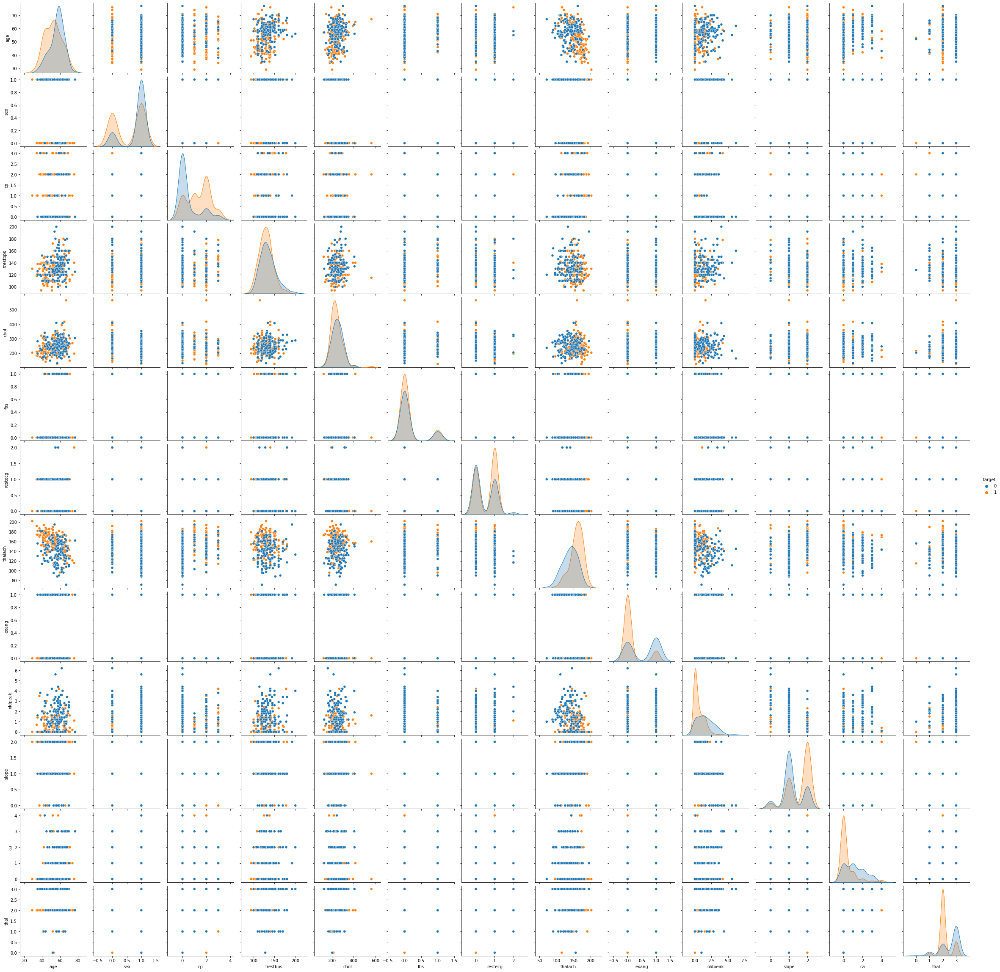

In [8]:
sns.pairplot(datos, hue = 'target', diag_kind="kde")

## Analisis de Componentes Principales
### A mano

Antes de poder hacer algo con los datos, tenemos que preprocesar los datos. Para esto lo que voy a hacer es estandarizarlos usando este metodo:


$$ z_i = \frac{x_i - \mu_i}{\sqrt{\sigma_{i,i}}}$$

Generalizando,

$$Z = (V^{1/2})^{-1}(X-M)$$

In [7]:
datos_pca = copy.copy(datos_no_label)
datos_pca = (datos_pca-datos_pca.mean())/datos_pca.std() #raiz de varianza = desviacion estandar
datos_pca

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,0.950624,0.679881,1.969864,0.762694,-0.255910,2.390484,-1.004171,0.015417,-0.69548,1.085542,-2.270822,-0.713249,-2.145324
1,-1.912150,0.679881,1.000921,-0.092585,0.072080,-0.416945,0.897478,1.630774,-0.69548,2.119067,-2.270822,-0.713249,-0.512075
2,-1.471723,-1.465992,0.031978,-0.092585,-0.815424,-0.416945,-1.004171,0.975900,-0.69548,0.310399,0.974740,-0.713249,-0.512075
3,0.179877,0.679881,0.031978,-0.662770,-0.198030,-0.416945,0.897478,1.237849,-0.69548,-0.206364,0.974740,-0.713249,-0.512075
4,0.289984,-1.465992,-0.936965,-0.662770,2.078611,-0.416945,0.897478,0.582975,1.43311,-0.378618,0.974740,-0.713249,-0.512075
...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.289984,-1.465992,-0.936965,0.477601,-0.101562,-0.416945,0.897478,-1.163356,1.43311,-0.723126,-0.648041,-0.713249,1.121174
299,-1.031296,0.679881,1.969864,-1.232956,0.342190,-0.416945,0.897478,-0.770432,-0.69548,0.138144,-0.648041,-0.713249,1.121174
300,1.501157,0.679881,-0.936965,0.705675,-1.027653,2.390484,0.897478,-0.377507,-0.69548,2.032940,-0.648041,1.242538,1.121174
301,0.289984,0.679881,-0.936965,-0.092585,-2.223854,-0.416945,0.897478,-1.512623,1.43311,0.138144,-0.648041,0.264644,1.121174


Ahora que ya tenemos nuestros datos estandarizados, podemos realizar el PCA.

Primero hay que sacar la matriz de covarianza

In [10]:
# pd.plotting.scatter_matrix(datos_pca, diagonal='kde', alpha=0.8, figsize=(15,15), s =200, marker='o')
# plt.title("Scatter Plot Matrix con sus  funcion de densidad de probabilidad")
# plt.show()

Ahora, para continuar con el analisis, tenemos que conseguir la matriz de correlacion

In [8]:
corr_matrix = datos_pca.corr()
corr_matrix

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244


Text(0.5, 1.0, 'La matriz de correlacion')

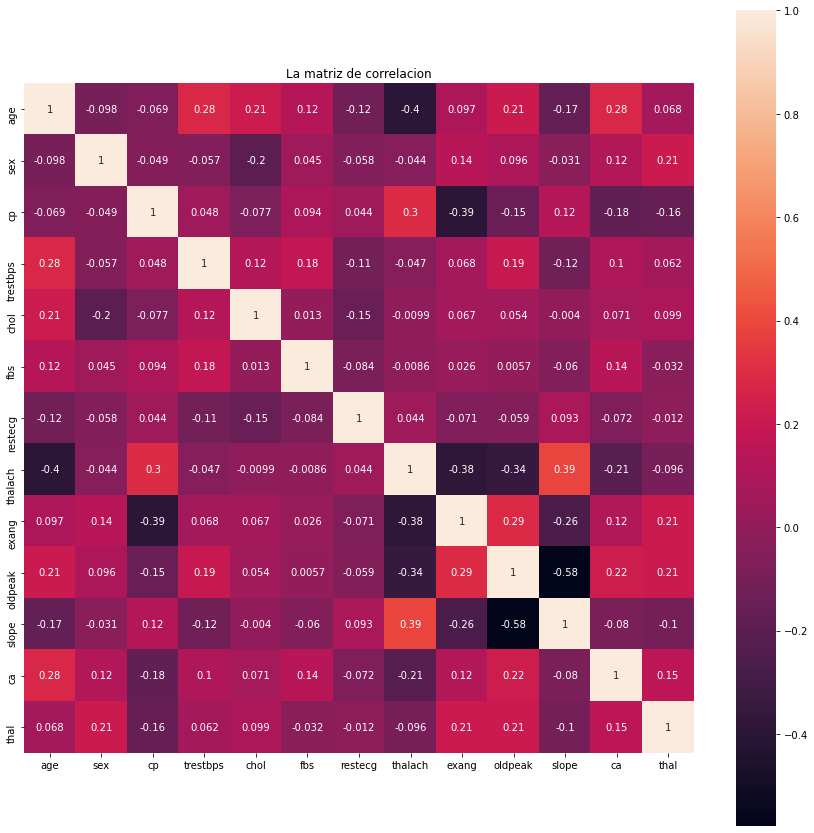

In [9]:
plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, vmax= 1, square= True, annot=True)
plt.title('La matriz de correlacion')

Ya que la tenemos, calculamos los eigenvalores y eigenvectores

In [10]:
evalues, evectors = np.linalg.eig(corr_matrix)

In [11]:
evalues

array([2.76302691, 1.536692  , 0.37186073, 0.42314238, 1.2228343 ,
       1.18114551, 0.53010476, 1.02196654, 0.97001587, 0.86276993,
       0.77594538, 0.7189255 , 0.62157019])

In [12]:
evectors

array([[ 0.31420252,  0.40614872,  0.18181083,  0.54823509, -0.09407661,
        -0.0206618 , -0.14054369,  0.30715312,  0.12829615,  0.22373018,
        -0.2624772 ,  0.37900026,  0.01672242],
       [ 0.09083783, -0.37779171,  0.06093808, -0.01101603,  0.55484915,
        -0.25530873, -0.28760018, -0.0507044 , -0.05496875,  0.16250682,
        -0.17599193,  0.1989252 , -0.53561904],
       [-0.27460749,  0.29726609,  0.00635061, -0.09720829,  0.35697431,
         0.28790041,  0.59428374, -0.16317945,  0.19341117,  0.21538959,
         0.04794993,  0.35143235, -0.16435134],
       [ 0.18392019,  0.43818675,  0.0201296 , -0.25872142,  0.2038493 ,
         0.02260103, -0.06413037, -0.18813809,  0.17945982, -0.33276335,
        -0.59533383, -0.35039179, -0.07152427],
       [ 0.11737503,  0.36451402, -0.00745311, -0.18379048, -0.40782498,
        -0.34340982, -0.10887361, -0.3200667 ,  0.10472957, -0.04932936,
         0.37238051,  0.1539752 , -0.49516986],
       [ 0.07363999,  0.317433

In [16]:
sum(evalues)

13.0

Vemos que la suma de los eigenvalores es lo mismo que el numero de las variables. Ahora lo que hacemos es ver cuales son los que aportan mas varianza

In [13]:
varianza_explicada = evalues/np.sum(evalues)
varianza_explicada

array([0.21254053, 0.11820708, 0.02860467, 0.03254941, 0.09406418,
       0.09085735, 0.04077729, 0.07861281, 0.07461661, 0.06636692,
       0.05968811, 0.05530196, 0.04781309])

In [49]:
sum(varianza_explicada[:5])

0.48596587082561915

Tambien podemos visualizarlo para que sea mas facil ver cuanto componentes usar

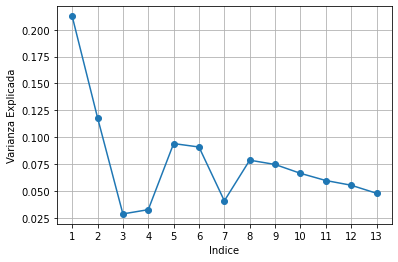

In [14]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), varianza_explicada,marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

Pero lo que hay que hacer es ordenarlos de mayor a menor, entonces eso es lo que tenemos que hacer

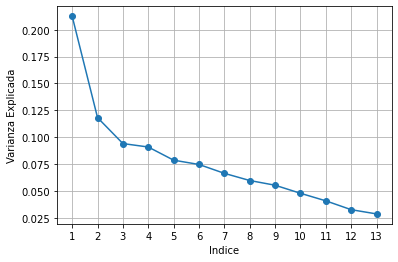

In [15]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), sorted(varianza_explicada, reverse = True),marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

Con esta visualizacion, podemos determinar cuantos componentes queremos. En este caso decidire por los primeros 5. Para esto, debemos de recordar el modelo de los componentes principales

$$Y = AX$$

Lo cual podemos ver como $$Y = e*X$$
donde $e$ son los eigenvectores

In [16]:
pca_vectors = evectors[:, :5]

In [17]:
y1 = datos_pca.dot(pca_vectors[:, 0])
y2 = datos_pca.dot(pca_vectors[:, 1])
y3 = datos_pca.dot(pca_vectors[:, 2])
y4 = datos_pca.dot(pca_vectors[:, 3])
y5 = datos_pca.dot(pca_vectors[:, 4])

In [22]:
y1

0      0.623080
1     -0.455235
2     -1.825785
3     -1.713172
4     -0.370743
         ...   
298    1.144778
299   -0.707423
300    2.454944
301    1.759844
302   -0.858636
Length: 303, dtype: float64

Ya tenemos nuestros componentes princiapeles, pero asi en numeros no dicen mucho, por lo que vamos a intentar hacer una visualizacion

In [55]:
list(labels.unique())

[1, 0]

In [18]:
def plot_scatter(y1,y2,xlabel, ylabel):
    fig, ax = plt.subplots(figsize=(15,8))
    label_unique = list(labels.unique())
    label_colors = ["r", "g"]

    for i,label in enumerate(labels.to_list()):
        plt.scatter(y1[i], y2[i], label = label, s = 20, c=label_colors[label_unique.index(label)])
        ax.annotate(str(i+1), (y1[i], y2[i]))
    from collections import OrderedDict
    handles, plot_labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(plot_labels, handles))
    plt.legend(by_label.values(), by_label.keys(), prop={'size': 15}, loc=4)
    # plt.legend(by_label.values(), ["Muerto", 'No muerto'])

    ax.set_xlabel(f"Componenete principal {xlabel}")
    ax.set_ylabel(f"Componente principal {ylabel}")
    ax.axhline(y=0, color="grey", linestyle="--")
    ax.axvline(x=0, color="grey", linestyle="--")
    plt.grid(True)

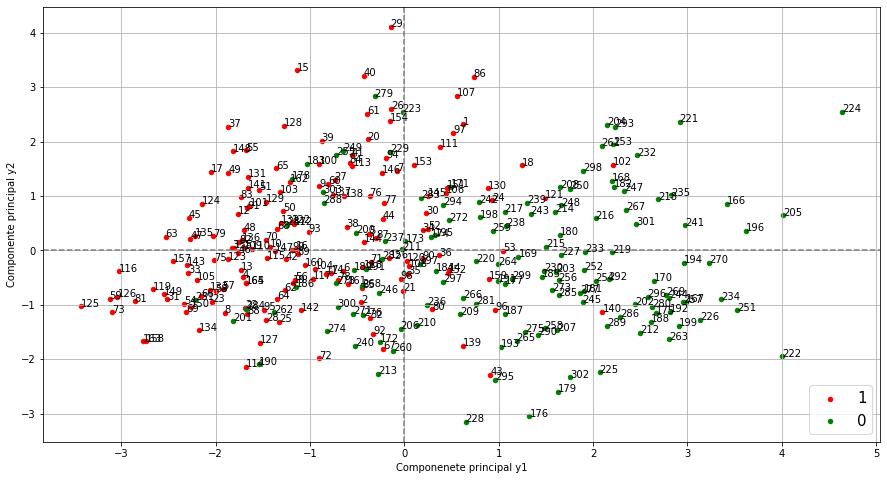

In [57]:
plot_scatter(y1, y2, "y1", "y2")

Donde 1 es que no sufrio una enfermadad cardiaca y 0 que si la sufrio. Para tener una mejor comparacion, debemos de graficar todos contra todos. Al final nos van a quedar 6 graficas

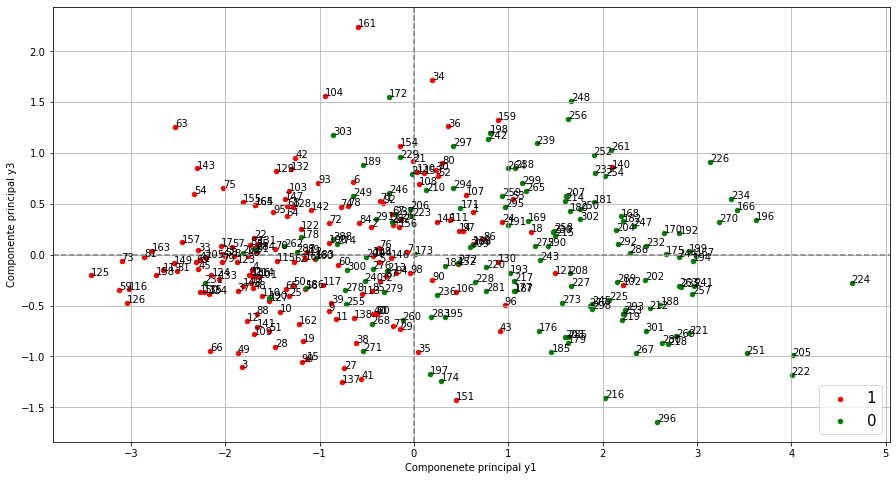

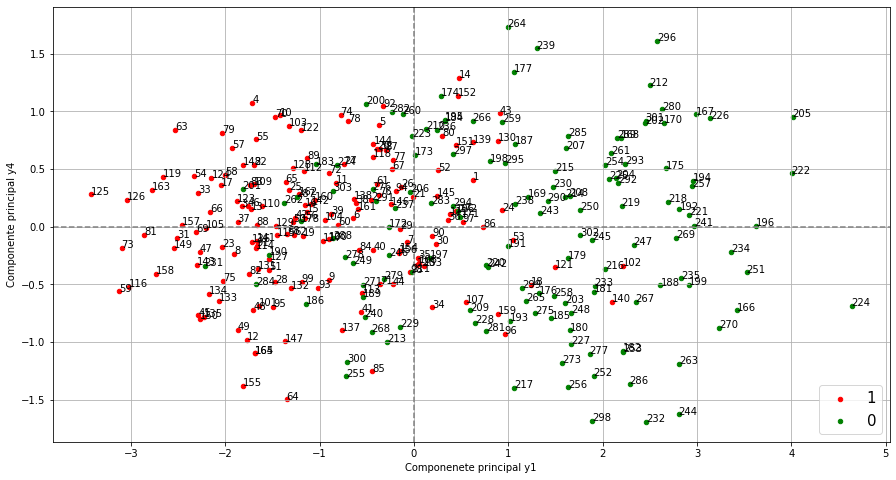

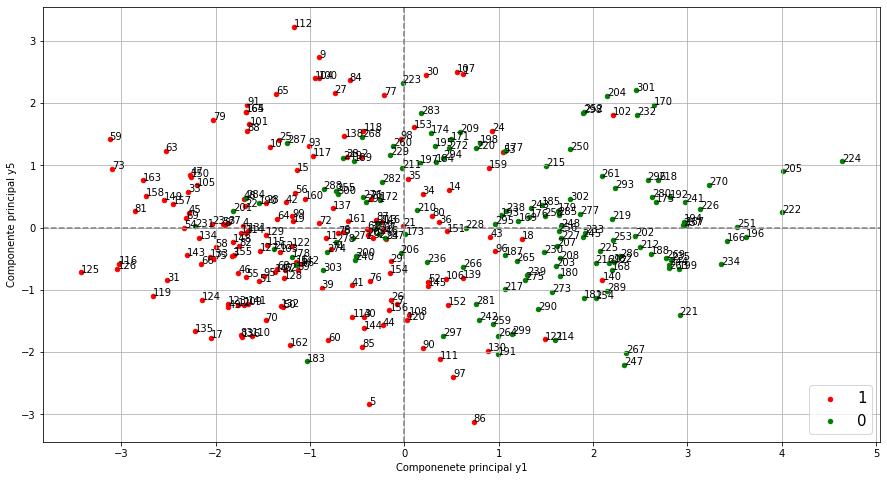

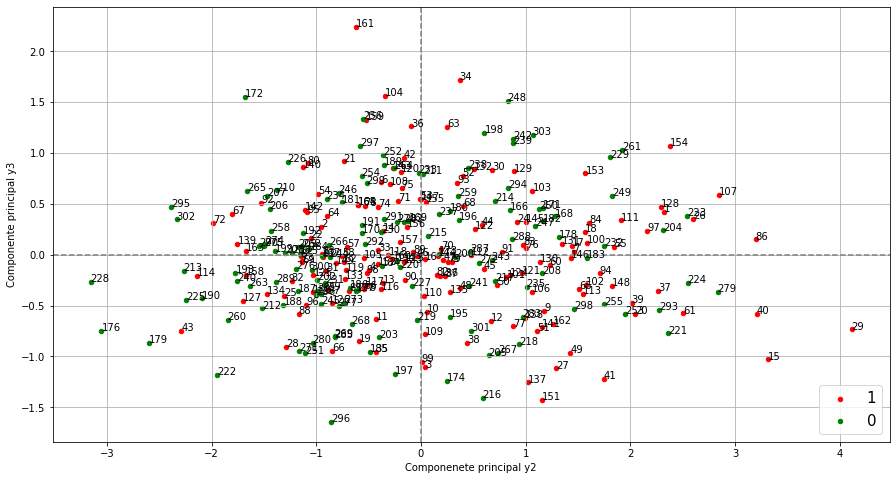

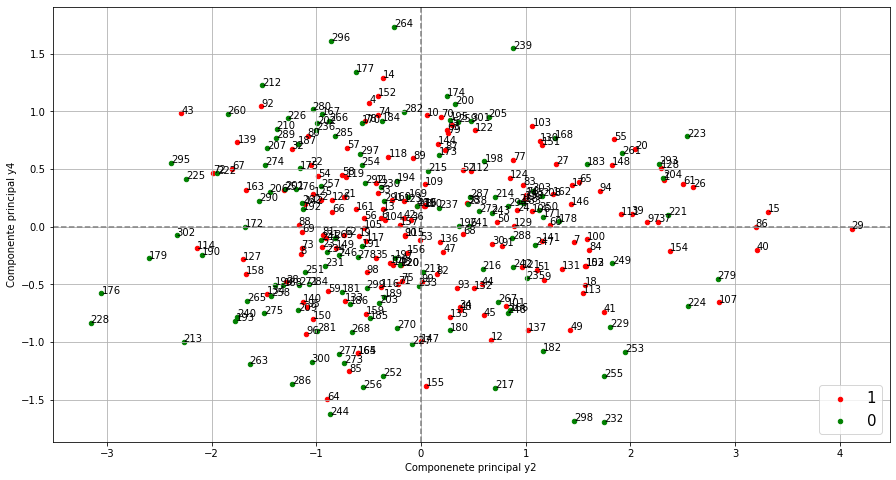

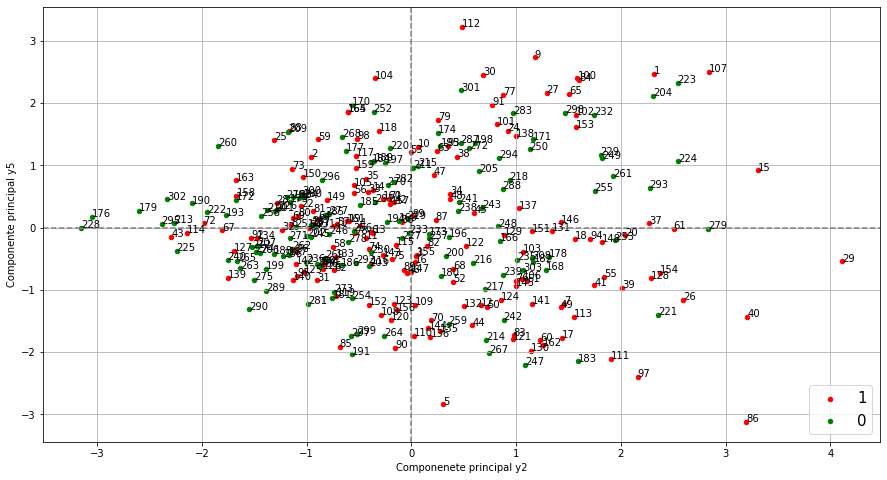

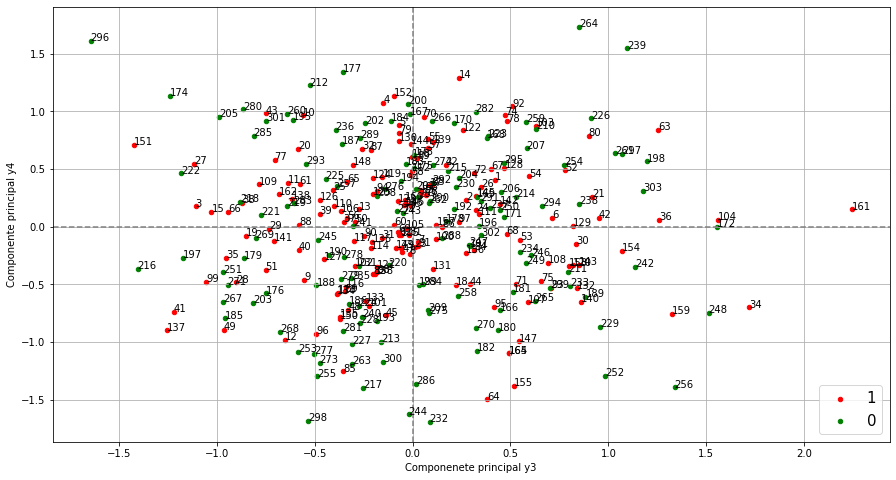

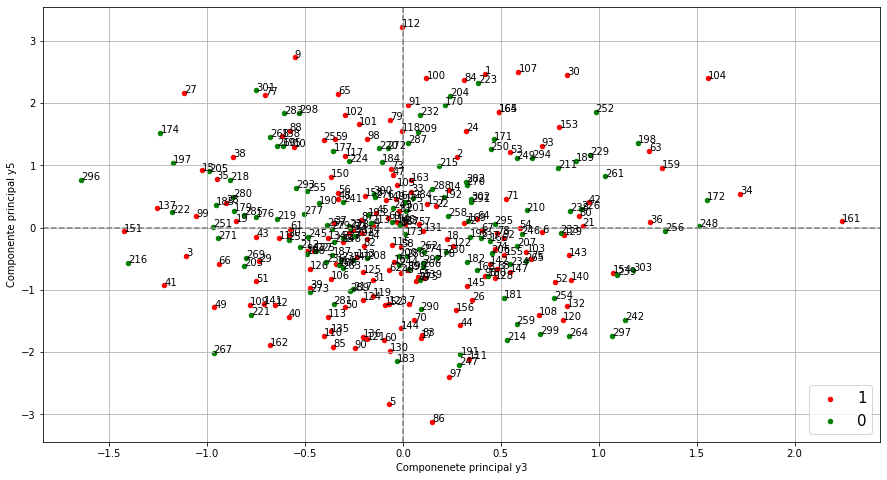

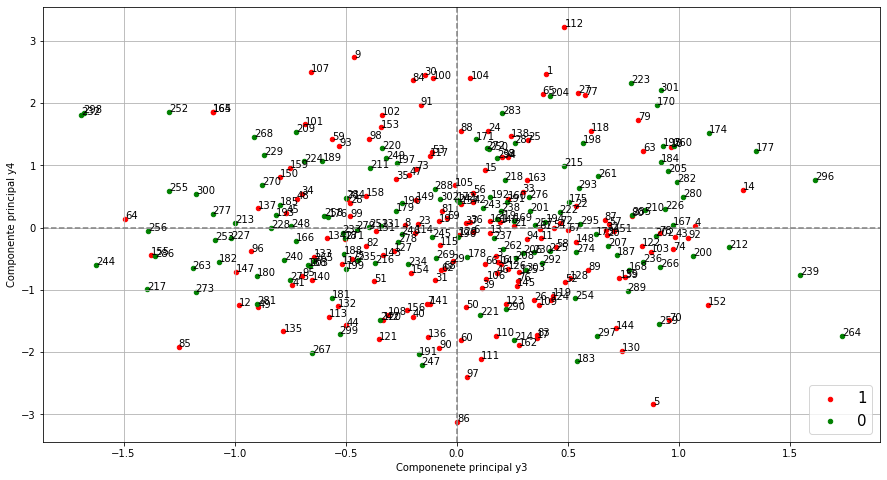

In [58]:
plot_scatter(y1, y3, "y1", "y3")
plot_scatter(y1, y4, "y1", "y4")
plot_scatter(y1, y5, "y1", "y5")
plot_scatter(y2, y3, "y2", "y3")
plot_scatter(y2, y4, "y2", "y4")
plot_scatter(y2, y5, "y2", "y5")
plot_scatter(y3, y4, "y3", "y4")
plot_scatter(y3, y5, "y3", "y5")
plot_scatter(y4, y5, "y3", "y4")

## Analisis de componentes principales
### con sklearn

In [19]:
from sklearn.decomposition import PCA

In [20]:
pca = PCA().fit(datos_pca)

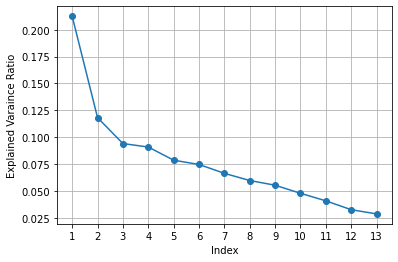

In [21]:
plt.plot(np.arange(1, datos_pca.shape[1] +1), pca.explained_variance_ratio_, marker = 'o')
plt.xlabel('Index')
plt.ylabel('Explained Varaince Ratio')
plt.xticks(np.arange(1, datos_pca.shape[1] + 1))
plt.grid(True)
plt.show()

In [22]:
pca = PCA(n_components=5)
pca = pca.fit_transform(datos_pca)
pca

array([[ 0.62307999,  2.31743663,  2.47058555,  2.67181961,  0.37463354],
       [-0.4552349 , -0.95576989,  1.13771273,  2.42283034,  2.27001191],
       [-1.82578459,  0.04281395, -0.45148191,  0.40574371,  0.86636898],
       ...,
       [ 2.45494434,  0.47747205,  2.20456939,  0.25894808, -1.33248552],
       [ 1.75984412, -2.33295689,  0.45400154,  0.53592012, -1.18065431],
       [-0.85863636,  1.06675087, -0.68893461,  0.23007281,  0.22374586]])

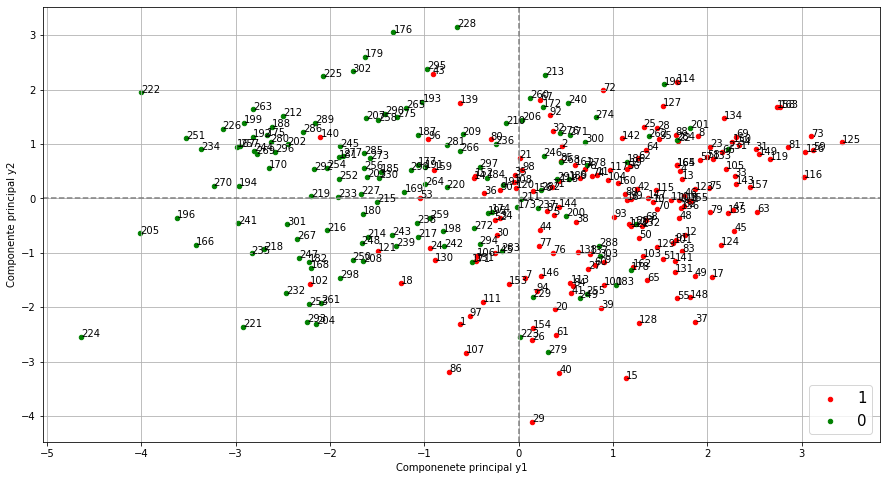

In [23]:
y1 = - pca[:, 0]
y2 = - pca[:,1]
plot_scatter(y1,y2, "y1", "y2")

es la misma grafica, ~~y con menos pasos~~. Lo unico distinto que se tuvo que hacer, fue que hay que multiplicar los resultados por -1, ya que salen con el signo contrario.

## Analisis Factorial
### a mano
#### de nuevo
¿qué podria salir mal?

Recordando el modelo del Analisis Factorial:

$$X = M + LF + U$$

Esta parte va a ser un poco mas corta, porque, sorpresa, podemos usar la matriz de correlacion que ya tenemos asi como los eigenvalores y eigenvectores de esa matriz. 

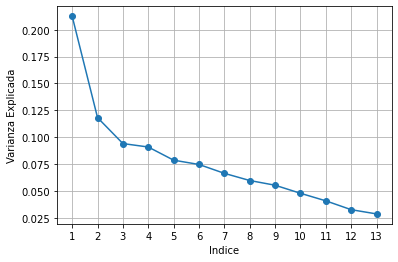

In [24]:
plt.plot(np.arange(1, corr_matrix.shape[0] + 1), sorted(varianza_explicada, reverse = True),marker = 'o')
plt.xlabel("Indice")
plt.ylabel("Varianza Explicada")
plt.xticks(np.arange(1,corr_matrix.shape[0] + 1))
plt.grid(True)

viendo la grafica, tomamos igual los primeros 4. Recordemos que para calcular la matriz de pesos $L$, tenemos que hacer la siguente multiplicacion:

$$\sqrt{\lambda_i} *$$

In [25]:
af_vectors = evectors[:, :4]
af_values = evalues[:4]

In [26]:
af_values = np.sqrt(af_values)

In [27]:
l = af_values * af_vectors; l

array([[ 0.52227859,  0.50347568,  0.11086895,  0.35662361],
       [ 0.15099387, -0.46832338,  0.03716028, -0.00716586],
       [-0.45646233,  0.3685011 ,  0.00387263, -0.0632334 ],
       [ 0.30571867,  0.54319112,  0.01227511, -0.16829672],
       [ 0.19510495,  0.45186391, -0.00454493, -0.1195546 ],
       [ 0.12240701,  0.39350103, -0.07754688,  0.01608645],
       [-0.21231388, -0.27381256,  0.04539517, -0.00175268],
       [-0.69231795,  0.09653795,  0.19311988,  0.39609313],
       [ 0.60051159, -0.32616984,  0.09069414,  0.15551918],
       [ 0.69753883, -0.06477703, -0.37477047,  0.22170955],
       [-0.63127087,  0.05996623, -0.39342334,  0.08688387],
       [ 0.45422534,  0.11670806,  0.09529041, -0.09499188],
       [ 0.36905576, -0.24881981,  0.00956764, -0.04722143]])

In [29]:
for i,j in enumerate(l):
    print(f"x{i+1} = {j[0]:.2f}f1 + {j[1]:.2f}f2 + {j[2]:.2f}f3 + {j[3]:.2f}f4")

x1 = 0.52f1 + 0.50f2 + 0.11f3 + 0.36f4
x2 = 0.15f1 + -0.47f2 + 0.04f3 + -0.01f4
x3 = -0.46f1 + 0.37f2 + 0.00f3 + -0.06f4
x4 = 0.31f1 + 0.54f2 + 0.01f3 + -0.17f4
x5 = 0.20f1 + 0.45f2 + -0.00f3 + -0.12f4
x6 = 0.12f1 + 0.39f2 + -0.08f3 + 0.02f4
x7 = -0.21f1 + -0.27f2 + 0.05f3 + -0.00f4
x8 = -0.69f1 + 0.10f2 + 0.19f3 + 0.40f4
x9 = 0.60f1 + -0.33f2 + 0.09f3 + 0.16f4
x10 = 0.70f1 + -0.06f2 + -0.37f3 + 0.22f4
x11 = -0.63f1 + 0.06f2 + -0.39f3 + 0.09f4
x12 = 0.45f1 + 0.12f2 + 0.10f3 + -0.09f4
x13 = 0.37f1 + -0.25f2 + 0.01f3 + -0.05f4


In [30]:
L = l@l.T
pd.DataFrame(L)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.665735,-0.155364,-0.074990,0.374496,0.286262,0.259188,-0.244337,-0.150311,0.214933,0.369212,-0.312141,0.272680,0.051696
1,-0.155364,0.243558,-0.240904,-0.206565,-0.181471,-0.168800,0.097874,-0.145409,0.245682,0.120145,-0.138644,0.018150,0.172947
2,-0.074990,-0.240904,0.348164,0.071307,0.084997,0.087814,-0.003700,0.327293,-0.403788,-0.357741,0.303231,-0.157954,-0.257127
3,0.374496,-0.206565,0.071307,0.416995,0.325161,0.247509,-0.212789,-0.223507,-0.018645,0.136151,-0.179870,0.219416,-0.014265
4,0.286262,-0.181471,0.084997,0.325161,0.256561,0.200120,-0.165146,-0.139685,-0.049227,0.082020,-0.104667,0.152281,-0.034826
5,0.259188,-0.168800,0.087814,0.247509,0.200120,0.176099,-0.137283,-0.055361,-0.059373,0.092523,-0.021769,0.092608,-0.054237
6,-0.244337,0.097874,-0.003700,-0.212789,-0.165146,-0.137283,0.122114,0.128628,-0.034343,-0.147762,0.099596,-0.123902,-0.009709
7,-0.150311,-0.145409,0.327293,-0.223507,-0.139685,-0.055361,0.128628,0.682809,-0.368118,-0.473730,0.401265,-0.322425,-0.296381
8,0.214933,0.245682,-0.403788,-0.018645,-0.049227,-0.059373,-0.034343,-0.368118,0.499413,0.440499,-0.420814,0.228570,0.296304
9,0.369212,0.120145,-0.357741,0.136151,0.082020,0.092523,-0.147762,-0.473730,0.440499,0.680365,-0.277514,0.252507,0.259493


In [76]:
np.max(abs(L))

0.6828087818416108

In [34]:
comunalidades = [L[i,i] for i in range(len(L))]
comunalidades

[0.6657350162962259,
 0.24355817428866822,
 0.34816437684501317,
 0.4169949604337565,
 0.2565608926065021,
 0.1760988286491699,
 0.12211429623363941,
 0.6828087818416108,
 0.4994125796219886,
 0.6803645121462422,
 0.5644295952951293,
 0.23804514683212089,
 0.20043486017581513]

In [35]:
psi = np.zeros_like(L)
psi

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [36]:
for i in range(psi.shape[0]):
    psi[i][i] = 1 - comunalidades[i]

In [37]:
pd.DataFrame(psi)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.334265,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
1,0.000000,0.756442,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
2,0.000000,0.000000,0.651836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.583005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.743439,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.823901,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.877886,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.317191,0.000000,0.000000,0.00000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500587,0.000000,0.00000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.319635,0.00000,0.000000,0.000000


In [38]:
pd.DataFrame((corr_matrix.values - (L - psi)))

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.668530,0.056918,0.006337,-0.095145,-0.072584,-0.137880,0.128126,-0.248211,-0.118132,-0.159200,0.143327,0.003646,0.016306
1,0.056918,1.512884,0.191551,0.149796,-0.016441,0.213832,-0.156070,0.101389,-0.104019,-0.024052,0.107933,0.100112,0.037094
2,0.006337,0.191551,1.303671,-0.023699,-0.161901,0.006630,0.048121,-0.031531,0.009507,0.208511,-0.183515,-0.023099,0.095392
3,-0.095145,0.149796,-0.023699,1.166010,-0.201986,-0.069979,0.098686,0.176809,0.086261,0.057065,0.058395,-0.118027,0.076475
4,-0.072584,-0.016441,-0.161901,-0.201986,1.486878,-0.186827,0.014106,0.129745,0.116250,-0.028068,0.100629,-0.081770,0.133629
5,-0.137880,0.213832,0.006630,-0.069979,-0.186827,1.647802,0.053094,0.046794,0.085038,-0.086775,-0.038125,0.045372,0.022218
6,0.128126,-0.156070,0.048121,0.098686,0.014106,0.053094,1.755771,-0.084504,-0.036390,0.088992,-0.006551,0.051860,-0.002273
7,-0.248211,0.101389,-0.031531,0.176809,0.129745,0.046794,-0.084504,0.634382,-0.010694,0.129543,-0.014481,0.109248,0.199942
8,-0.118132,-0.104019,0.009507,0.086261,0.116250,0.085038,-0.036390,-0.010694,1.001175,-0.152276,0.163065,-0.112831,-0.089550
9,-0.159200,-0.024052,0.208511,0.057065,-0.028068,-0.086775,0.088992,0.129543,-0.152276,0.639271,-0.300023,-0.029825,-0.049249


## Analisis Factorial
### mira mama, sin manos
#### pero con sklearn
##### o no?

In [78]:
# from sklearn.decomposition import FactorAnalysis
from factor_analyzer.factor_analyzer import FactorAnalyzer

Para poder utilizar esto, se necesita usar la version de sklearn=0.24 o mayor. [Aqui](https://scikit-learn.org/stable/install.html) hay una guia de como instalarla. Esta implementacion ya utiliza maximun likelihood de acuerdo con su [documentacion](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.FactorAnalysis.html#sklearn.decomposition.FactorAnalysis)

In [79]:
fa1 = FactorAnalyzer(rotation = "varimax", method = "ml")

In [80]:
fa1.fit(datos_no_label)

FactorAnalyzer(method='ml', rotation='varimax', rotation_kwargs={})

Text(0.5, 1.0, 'La matriz de correlacion, caclulada por la libreria')

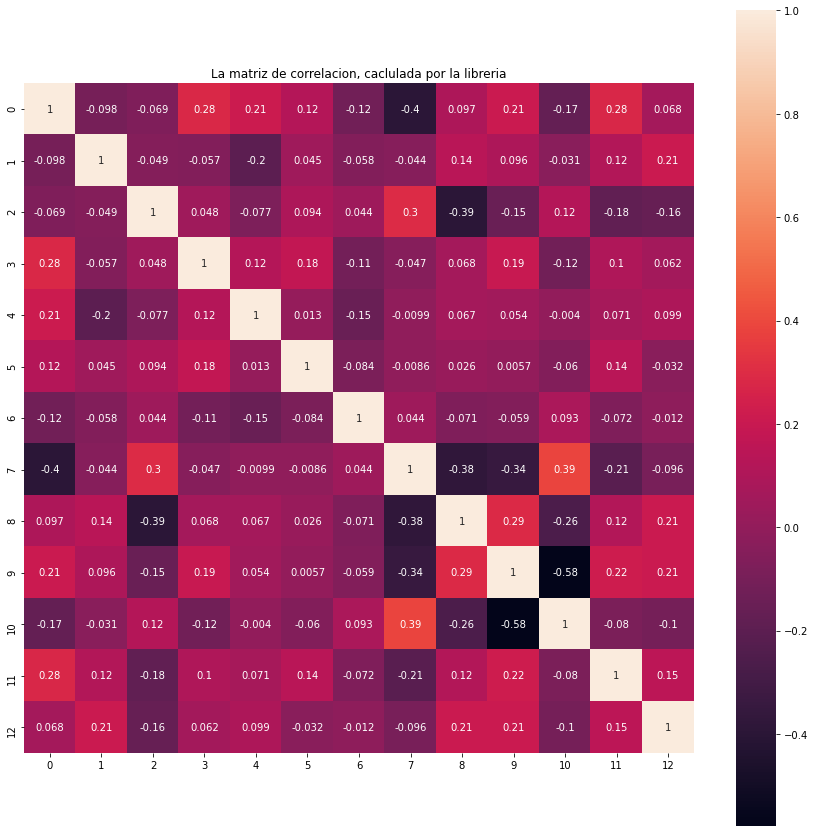

In [82]:
plt.figure(figsize=(15,15))
sns.heatmap(fa1.corr_, vmax= 1, square= True, annot=True)
plt.title('La matriz de correlacion, caclulada por la libreria')

In [83]:
evalues, v = fa1.get_eigenvalues()

In [85]:
evalues

array([2.76302691, 1.536692  , 1.2228343 , 1.18114551, 1.02196654,
       0.97001587, 0.86276993, 0.77594538, 0.7189255 , 0.62157019,
       0.53010476, 0.42314238, 0.37186073])

In [86]:
fa1 =  FactorAnalyzer(n_factors=5, rotation='varimax', method='ml')

In [87]:
fa1.fit(datos_no_label)

FactorAnalyzer(method='ml', n_factors=5, rotation='varimax', rotation_kwargs={})

In [103]:
L2 = fa1.loadings_@fa1.loadings_.T
pd.DataFrame(L2)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.501075,-0.098492,-0.061033,0.274336,0.203302,0.152739,-0.137759,-0.398489,0.124858,0.208417,-0.172746,0.255401,0.076998
1,-0.098492,0.995000,-0.049361,-0.056718,-0.197856,0.045112,-0.058047,-0.044020,0.141664,0.096090,-0.030726,0.118325,0.209986
2,-0.061033,-0.049361,0.537822,0.039969,-0.096099,0.079570,0.045736,0.295837,-0.387507,-0.149460,0.116910,-0.154093,-0.186429
3,0.274336,-0.056718,0.039969,0.217664,0.143584,0.113590,-0.095631,-0.046782,0.016608,0.196121,-0.112185,0.151240,0.058047
4,0.203302,-0.197856,-0.096099,0.143584,0.172182,0.056793,-0.072357,-0.009913,0.052028,0.053040,-0.016751,0.113267,0.041534
5,0.152739,0.045112,0.079570,0.113590,0.056793,0.083077,-0.055490,-0.008681,-0.035439,0.021044,-0.002517,0.075840,0.015319
6,-0.137759,-0.058047,0.045736,-0.095631,-0.072357,-0.055490,0.060175,0.044133,-0.052399,-0.069026,0.033398,-0.100838,-0.060738
7,-0.398489,-0.044020,0.295837,-0.046782,-0.009913,-0.008681,0.044133,0.995000,-0.378712,-0.344190,0.386794,-0.213132,-0.096373
8,0.124858,0.141664,-0.387507,0.016608,0.052028,-0.035439,-0.052399,-0.378712,0.345806,0.295128,-0.228981,0.170731,0.179931
9,0.208417,0.096090,-0.149460,0.196121,0.053040,0.021044,-0.069026,-0.344190,0.295128,0.836673,-0.577308,0.207919,0.208623


In [100]:
comunalities = fa1.get_communalities()
comunalities

array([0.50107536, 0.99500009, 0.53782201, 0.217664  , 0.17218249,
       0.08307659, 0.06017549, 0.99500018, 0.34580591, 0.83667337,
       0.43099537, 0.19656709, 0.14424992])

In [94]:
fa1.rotation_matrix_

array([[ 0.65056491,  0.66093549,  0.2198156 ,  0.28882653, -0.0904981 ],
       [-0.64447988,  0.73763974, -0.17366883, -0.08818632,  0.05094712],
       [-0.34041495, -0.05370745,  0.90169347,  0.13301464, -0.22469794],
       [-0.18813274, -0.11156969, -0.11048029,  0.88628827,  0.39299553],
       [ 0.10067129,  0.06098857,  0.31026316, -0.32496556,  0.88559575]])

In [99]:
fa1.loadings_.shape

(13, 5)

In [106]:
psi = np.eye(L2.shape[0])
psi

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

In [108]:
for i in range(psi.shape[0]):
    psi[i,i] = psi[i,i] - comunalities[i]

pd.DataFrame(psi)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.002151,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
1,0.000000,-0.99,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
2,0.000000,0.00,-0.075644,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
3,0.000000,0.00,0.000000,0.564672,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
4,0.000000,0.00,0.000000,0.000000,0.655635,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
5,0.000000,0.00,0.000000,0.000000,0.000000,0.833847,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
6,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.879649,0.00,0.000000,0.000000,0.000000,0.000000,0.0000
7,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,-0.99,0.000000,0.000000,0.000000,0.000000,0.0000
8,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.308388,0.000000,0.000000,0.000000,0.0000
9,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,-0.673347,0.000000,0.000000,0.0000


In [111]:
pd.DataFrame(fa1.corr_ - (L2 + psi))

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.501075,4.567416e-05,-0.007620,0.005015,0.010376,-0.031432,0.021548,-3.326827e-05,-2.805747e-02,0.001596,0.003932,0.020926,-0.008997
1,0.000046,9.950001e-01,0.000008,-0.000051,-0.000056,-0.000080,-0.000150,9.813373e-08,1.186379e-07,0.000003,0.000015,-0.000064,0.000055
2,-0.007620,7.848946e-06,0.537822,0.007639,0.019194,0.014874,-0.001316,-7.459474e-05,-6.772981e-03,0.000229,0.002807,-0.026960,0.024693
3,0.005015,-5.090955e-05,0.007639,0.217664,-0.020409,0.063941,-0.018471,8.473438e-05,5.100779e-02,-0.002905,-0.009290,-0.049851,0.004163
4,0.010376,-5.623492e-05,0.019194,-0.020409,0.172182,-0.043499,-0.078683,-2.695528e-05,1.499465e-02,0.000912,0.012713,-0.042756,0.057269
5,-0.031432,-8.048202e-05,0.014874,0.063941,-0.043499,0.083077,-0.028699,1.136133e-04,6.110368e-02,-0.015297,-0.057377,0.062140,-0.047338
6,0.021548,-1.495271e-04,-0.001316,-0.018471,-0.078683,-0.028699,0.060175,-1.005158e-05,-1.833379e-02,0.010255,0.059647,0.028796,0.048757
7,-0.000033,9.813373e-08,-0.000075,0.000085,-0.000027,0.000114,-0.000010,9.950002e-01,-1.003333e-04,0.000003,-0.000009,-0.000045,-0.000066
8,-0.028057,1.186379e-07,-0.006773,0.051008,0.014995,0.061104,-0.018334,-1.003333e-04,3.458059e-01,-0.006905,-0.028768,-0.054992,0.026823
9,0.001596,3.373387e-06,0.000229,-0.002905,0.000912,-0.015297,0.010255,3.144512e-06,-6.904737e-03,0.836673,-0.000229,0.014763,0.001621
